In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

In [1]:
import sys
sys.path.append("../")

from bechdelai.processing.video import extract_frames_from_videos
from bechdelai.vision.frame import Frame
from bechdelai.vision.face_detection import FaceDetector

###### Interesting tools
- OpenCV
- DeepFace
- RetinaFace
- Moviepy
- YOLO
- https://github.com/open-mmlab/mmaction2

##### References
- https://www.analyticsvidhya.com/blog/2018/09/deep-learning-video-classification-python/
- https://github.com/HuaizhengZhang/Awsome-Deep-Learning-for-Video-Analysis

# Exploration on first video

In [2]:
path = "../data/sample_videos/Andy Samberg dances on Megatron Man.mp4"

## Frame extraction
- https://www.analyticsvidhya.com/blog/2018/09/deep-learning-video-classification-python/

In [3]:
extract_frames_from_videos(path,"megatron")

ERROR! Session/line number was not unique in database. History logging moved to new session 120
Done!


## Face detection
- https://github.com/opencv/opencv/tree/master/data/haarcascades
- https://www.pyimagesearch.com/2021/04/05/opencv-face-detection-with-haar-cascades/
- https://realpython.com/face-recognition-with-python/

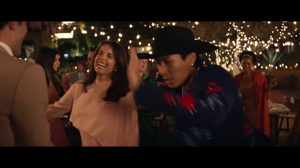

In [3]:
frame = Frame('megatron/frame9.jpg')
frame.resize(width = 300)
frame.show()

In [4]:
detector = FaceDetector()

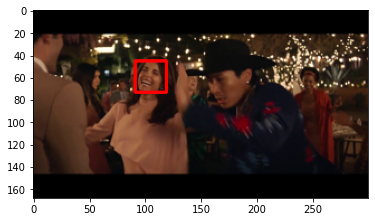

In [5]:
frame.show_faces(detector,scale_factor = 1.1,min_neighbors = 3)

In [6]:
faces = frame.extract_faces(detector,scale_factor = 1.1,min_neighbors = 3)

In [7]:
faces[0]

## All faces extraction

In [9]:
from bechdelai.vision.video import Video
from bechdelai.vision.face_detection import FaceDetector

detector = FaceDetector()

In [10]:
frames = Video(path = "megatron")
frames.resize(width = 600)

  0%|          | 0/84 [00:00<?, ?it/s]

In [11]:
frames.extract_faces(
    detector = detector,
    deepface_check = True,
    scale_factor = 1.3,
    min_neighbors = 3,
    face_size = (200,200),
    deepface_backend = "ssd"
)

  0%|          | 0/84 [00:00<?, ?it/s]

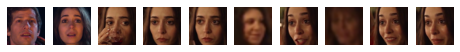

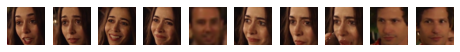

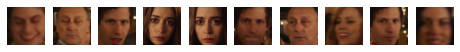

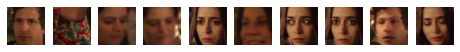

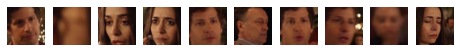

<Figure size 576x72 with 0 Axes>

In [12]:
frames.show_all_faces()

## Face analysis

A face analysis can be done using DeepFace pretrained algorithms, <br>
Such function is embedded in the ``frame.face`` object

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Constant'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Constant'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Constant'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on

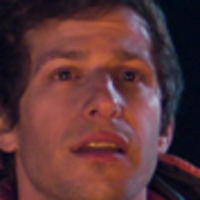

In [13]:
print(frames.faces[0].analyze())
frames.faces[0]

{'emotion': {'angry': 27.96088623767413, 'disgust': 5.170395160937021, 'fear': 38.8579183136176, 'happy': 2.3755140155860195, 'sad': 18.889525168509792, 'surprise': 4.902985239206865, 'neutral': 1.842780334817191}, 'dominant_emotion': 'fear', 'region': {'x': 16, 'y': 21, 'w': 167, 'h': 167}, 'age': 29, 'gender': 'Woman', 'race': {'asian': 0.009850455982013015, 'indian': 0.013129801774038587, 'black': 0.00029129208831385456, 'white': 91.40398399877357, 'middle eastern': 6.14175422689369, 'latino hispanic': 2.4309926770320747}, 'dominant_race': 'white'}


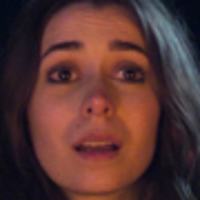

In [14]:
print(frames.faces[1].analyze())
frames.faces[1]

## Embeddings Analysis

In [15]:
from bechdelai.vision.face_recognition import FaceAnalyzer

In [16]:
%%time 

analyzer = FaceAnalyzer()
analyzer.load_vgg_model()

faces_array = analyzer.make_array_dataset(frames.faces)
embeddings = analyzer.make_embeddings(faces_array)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Constant'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Wall time: 9.48 s


In [17]:
embeddings2D = analyzer.reduce_embeddings(embeddings,n_components=2,metric = "cosine",n_neighbors = 50)


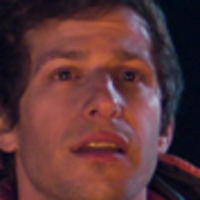
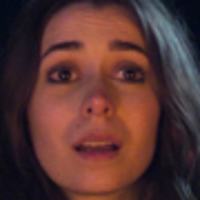
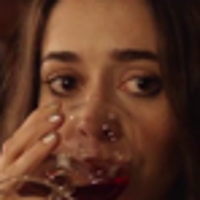
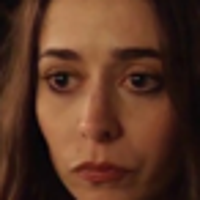
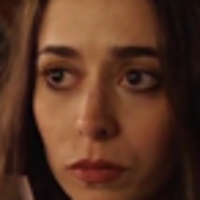
...
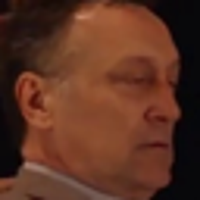
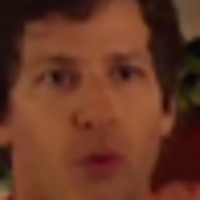
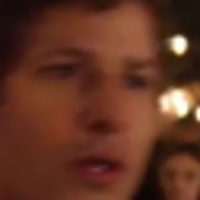
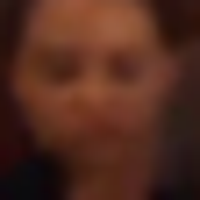
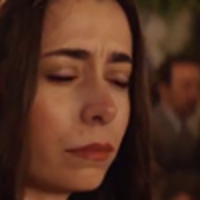

In [18]:
analyzer.show_embeddings2D(embeddings2D,frames.faces)

### Clustering

In [19]:
embeddings2D_with_clusters,clusters = analyzer.cluster_embeddings(embeddings2D,eps = 1) 
embeddings2D_with_clusters.head()

,x,y,cluster
0,1.367917,1.532471,0
1,-0.312312,5.206772,1
2,1.244405,3.617289,2
3,-0.967033,5.266981,1
4,-1.711886,5.330687,1



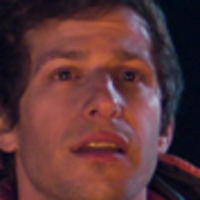
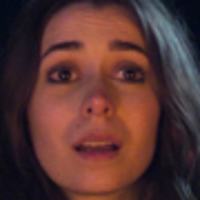
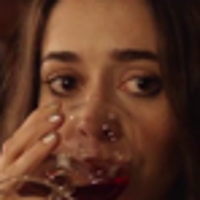
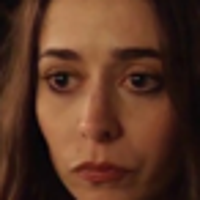
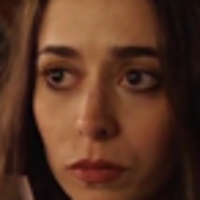
...
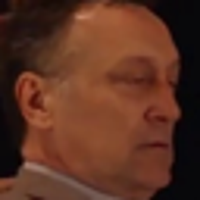
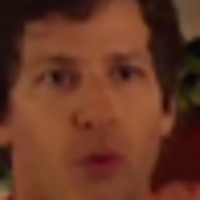
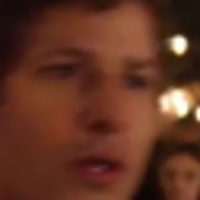
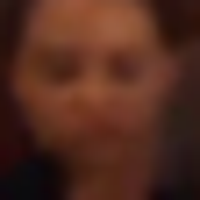
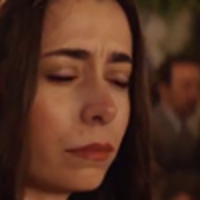

In [20]:
analyzer.show_embeddings2D(embeddings2D_with_clusters,frames.faces)

Answers question 1

In [22]:
import pandas as pd

clusters_cat = pd.DataFrame([
    [0,"man"],
    [1,"woman"],
    [2,"outlier"],   
],columns = ["cluster","gender"])
clusters_cat

,cluster,gender
0,0,man
1,1,woman
2,2,outlier


## Visualization of clusters over time (by frame)

In [23]:
frames.faces_metadata["cluster"] = clusters
frames.faces_metadata["count"] = 1
frames.faces_metadata = frames.faces_metadata.merge(clusters_cat,on="cluster").sort_values("frame_id")

Answers question 2

In [24]:
faces_group = frames.faces_metadata.groupby(["frame_id","gender"],as_index = False)["count"].sum()
faces_group.loc[faces_group["count"] >= 2]

,frame_id,gender,count


In [25]:
import plotly.express as px
px.bar(
    frames.faces_metadata.assign(count = lambda x : 1),
    x = "frame_id",y = "count",color = "gender"
)

# Supervised approach
Instead of using a clustering method, use face identification for each face using a reference database

In [26]:
from bechdelai.vision.face_recognition import FaceAnalyzer
analyzer = FaceAnalyzer()

In [33]:
matches = analyzer.match_faces(frames.faces,db_path = "./db")

  0%|          | 0/50 [00:00<?, ?it/s]

There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.2708418369293213  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.3342711925506592  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.3172295093536377  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.3193507194519043  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.32834744453430176  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.2984476089477539  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.2976086139678955  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.296306848526001  seconds
There are  6  representations found in  representations_

find function lasts  0.32113003730773926  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.31029367446899414  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.3087794780731201  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.316638708114624  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.33738064765930176  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.32613253593444824  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.34342384338378906  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.31194519996643066  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.34177565574645996  seconds
T

find function lasts  0.2849752902984619  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.30762434005737305  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.32692551612854004  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.2688586711883545  seconds
There are  6  representations found in  representations_vgg_face.pkl
find function lasts  0.31436824798583984  seconds


In [34]:
import plotly.express as px
px.bar(matches.assign(count = lambda x : 1),x = "frame_id",y = "count",color = "character")

In [35]:
matches

,identity,VGG-Face_cosine,character,frame_id
0,./db\andy_samberg/Andy-samberg-premiere-that-s...,0.398430,andy_samberg,0
1,./db\cristin_milioti/1200px-Cristin_Milioti_Ju...,0.333325,cristin_milioti,2
2,./db\cristin_milioti/A-3797844-1398361813-9949...,0.299346,cristin_milioti,3
3,./db\cristin_milioti/A-3797844-1398361813-9949...,0.331902,cristin_milioti,4
4,./db\cristin_milioti/A-3797844-1398361813-9949...,0.347492,cristin_milioti,8
5,./db\cristin_milioti/A-3797844-1398361813-9949...,0.313443,cristin_milioti,9
6,./db\cristin_milioti/A-3797844-1398361813-9949...,0.335060,cristin_milioti,10
7,./db\cristin_milioti/A-3797844-1398361813-9949...,0.312934,cristin_milioti,11
8,./db\cristin_milioti/A-3797844-1398361813-9949...,0.278098,cristin_milioti,12
9,./db\cristin_milioti/A-3797844-1398361813-9949...,0.354459,cristin_milioti,13


### Timeline

In [29]:
def fn_timeline(x):
    
    seq_id = 0
    seq_ids = []
    
    for i in range(len(x) - 1):
        seq_ids.append(seq_id)
        if (x[i+1] - x[i]) > 1:
            seq_id += 1
            
    # Add last element
    seq_ids.append(seq_id)
    return seq_ids

In [30]:
matches["seq_id"] = fn_timeline(matches["frame_id"])

timeline = matches.groupby(["character","seq_id"]).agg({"frame_id":["min","max"]})["frame_id"].reset_index()
timeline["max"] += 1

time_between_frames = 1
timeline["start"] = timeline["min"].map(lambda x : pd.Timedelta(seconds = x * time_between_frames))
timeline["end"] = timeline["max"].map(lambda x : pd.Timedelta(seconds = x * time_between_frames))
timeline["duration"] = timeline["end"] - timeline["start"]

start_date = pd.to_datetime("2022-01-01")
timeline["start"] = start_date + timeline["start"]
timeline["end"] = start_date + timeline["end"]

In [31]:
px.timeline(timeline,x_start = "start",x_end = "end",color = "character",y = "character")

# Improvements & Next steps

- Fetch directly face identification database from IMDB + Wikidata ? 
- Improve face detection, still get many false postives and face negatives even with stacked detectors
- Improve hyperparams selection for the pipeline
- Compute time on screen per person and gender to understand how female roles are under represented
- Visualize timeline using Plotly timeline feature
- Use same technology for face detection (DeepFace, OpenCV, RetinaFace ?)
- Create and read a config parameters identifying a male/female characters by folder (using yaml preferably)
- Remove print warnings from Deepface
- Test on other movies
- Test scale capabilities depending on computer available power
- Test out Terran library
- Create a streamlit tool for more versatility